In [1]:
import numpy as np
import pandas as pd 
import dataprep.eda as eda
from dataprep.eda import create_report
import seaborn as sns 
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score,precision_score,recall_score,roc_auc_score,f1_score,log_loss,roc_curve,classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE

In [2]:
company_df = pd.read_csv("bank (1).csv")

In [3]:
print(company_df.columns)

Index(['Bankrupt', ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons',
       ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)',
       ' Operating Profit Per Share (Yuan ¥)',
       ' Per Share Net profit before tax (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' Operating Profit 

In [4]:
company_df.head()

,Bankrupt,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholders Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [5]:
company_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt                                                  6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

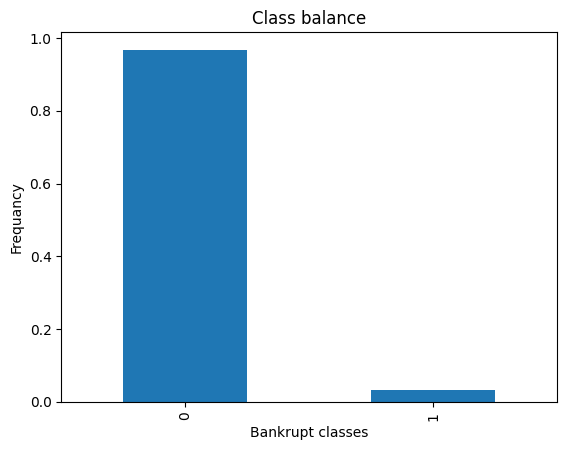

In [6]:
company_df['Bankrupt'].value_counts(normalize= True).plot(kind= 'bar')
plt.xlabel("Bankrupt classes")
plt.ylabel("Frequancy")
plt.title("Class balance");

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


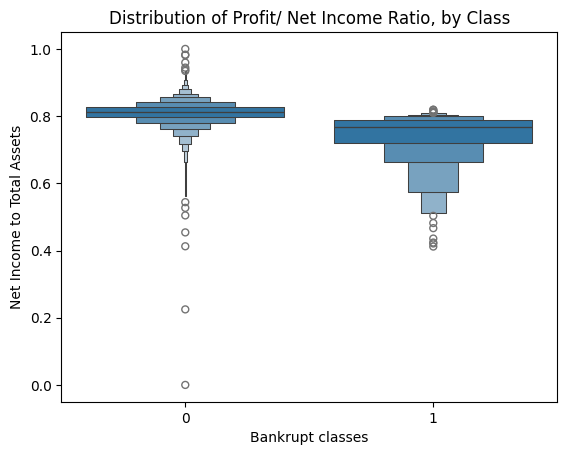

In [7]:
sns.boxenplot(x="Bankrupt" , y=" Net Income to Total Assets" , data=company_df)
plt.xlabel("Bankrupt classes")
plt.ylabel("Net Income to Total Assets")
plt.title("Distribution of Profit/ Net Income Ratio, by Class");

In [8]:
company_df[' Net Income to Total Assets'].describe()


count    6819.000000
mean        0.807760
std         0.040332
min         0.000000
25%         0.796750
50%         0.810619
75%         0.826455
max         1.000000
Name:  Net Income to Total Assets, dtype: float64

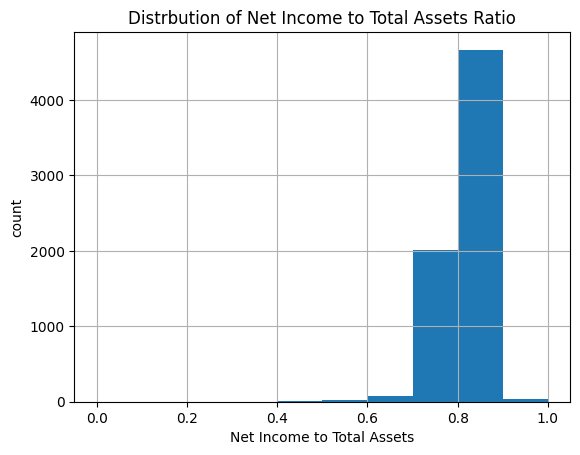

In [9]:
#We create a histogram to check whether the distrbution is skewed significantly or not

company_df[" Net Income to Total Assets"].hist()
plt.xlabel("Net Income to Total Assets")
plt.ylabel("count")
plt.title("Distrbution of Net Income to Total Assets Ratio");

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


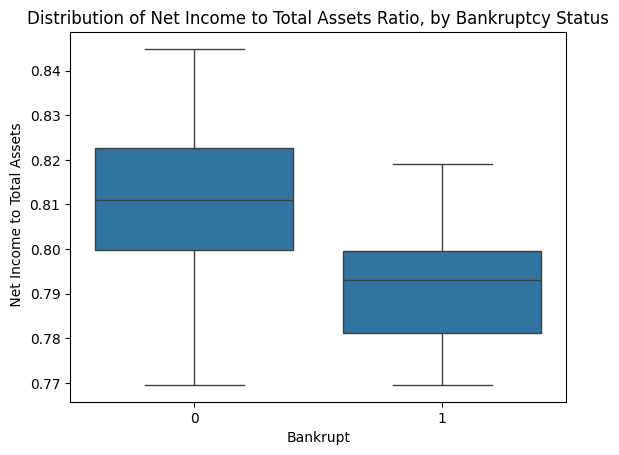

In [10]:
q1 , q9 = company_df[' Net Income to Total Assets'].quantile([0.1,0.9])
mask = company_df[" Net Income to Total Assets"].between(q1 , q9)
sns.boxplot(x='Bankrupt' , y=' Net Income to Total Assets', data= company_df[mask])
plt.xlabel("Bankrupt")
plt.ylabel(" Net Income to Total Assets")
plt.title("Distribution of Net Income to Total Assets Ratio, by Bankruptcy Status");

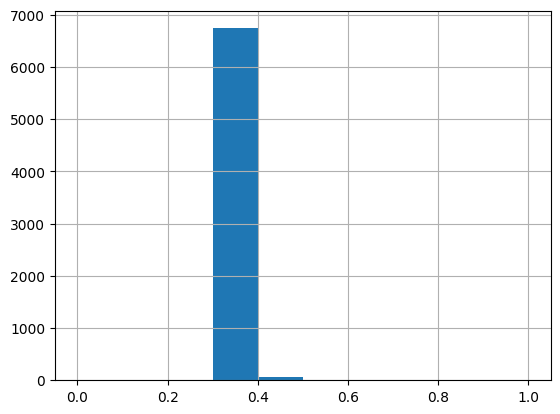

In [11]:
company_df[' Borrowing dependency'].hist();

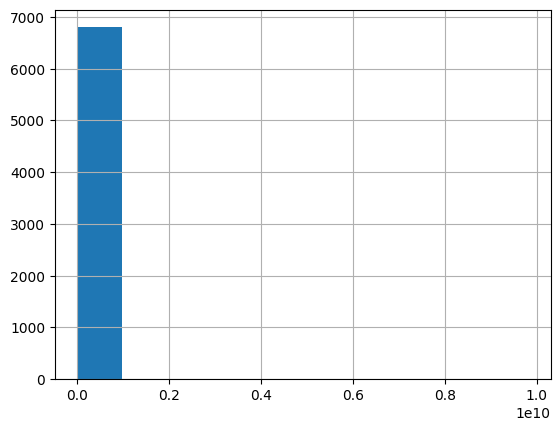

In [12]:
company_df[' Total assets to GNP price'].hist();

In [13]:
selected_columns = [
    'Bankrupt',
    ' Borrowing dependency',
    ' Current Liability to Current Assets',
    ' Debt ratio %',
    ' Net Income to Stockholders Equity',
    ' Net Value Per Share (A)',
    ' Net profit before tax/Paid-in capital',
    ' Operating Gross Margin',
    ' Per Share Net profit before tax (Yuan ¥)',
    ' Persistent EPS in the Last Four Seasons',
    ' ROA(A) before interest and % after tax',
    ' Working Capital to Total Assets'
]

bankruptcy_df = company_df[selected_columns]
print(bankruptcy_df.head())


   Bankrupt   Borrowing dependency   Current Liability to Current Assets  \
0         1               0.390284                              0.118250   
1         1               0.376760                              0.047775   
2         1               0.379093                              0.025346   
3         1               0.379743                              0.067250   
4         1               0.375025                              0.047725   

    Debt ratio %   Net Income to Stockholders Equity  \
0       0.207576                            0.827890   
1       0.171176                            0.839969   
2       0.207516                            0.836774   
3       0.151465                            0.834697   
4       0.106509                            0.839973   

    Net Value Per Share (A)   Net profit before tax/Paid-in capital  \
0                  0.147950                                0.137757   
1                  0.182251                                0.168

In [14]:
bankruptcy_df.describe()

,Bankrupt,Borrowing dependency,Current Liability to Current Assets,Debt ratio %,Net Income to Stockholders Equity,Net Value Per Share (A),Net profit before tax/Paid-in capital,Operating Gross Margin,Per Share Net profit before tax (Yuan ¥),Persistent EPS in the Last Four Seasons,ROA(A) before interest and % after tax,Working Capital to Total Assets
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000
mean,0.032263,0.374654,0.031506,0.113177,0.840402,0.190633,0.182715,0.607948,0.184361,0.228813,0.558625,0.814125
std,0.176710,0.016286,0.030845,0.053920,0.014523,0.033474,0.030785,0.016934,0.033180,0.033263,0.065620,0.059054
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.370168,0.018034,0.072891,0.840115,0.173613,0.169376,0.600445,0.170370,0.214711,0.535543,0.774309
50%,0.000000,0.372624,0.027597,0.111407,0.841179,0.184400,0.178456,0.605997,0.179709,0.224544,0.559802,0.810275
75%,0.000000,0.376271,0.038375,0.148804,0.842357,0.199570,0.191607,0.613914,0.193493,0.238820,0.589157,0.850383
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


  0%|                                                                                         | 0/2298 [00:00<…

C:\Users\ARYAN\AppData\Local\Programs\Python\Python310\lib\site-packages\dask\core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
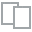
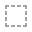
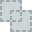
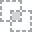
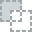
...
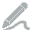
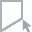
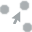
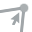
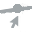

In [15]:
create_report(bankruptcy_df)

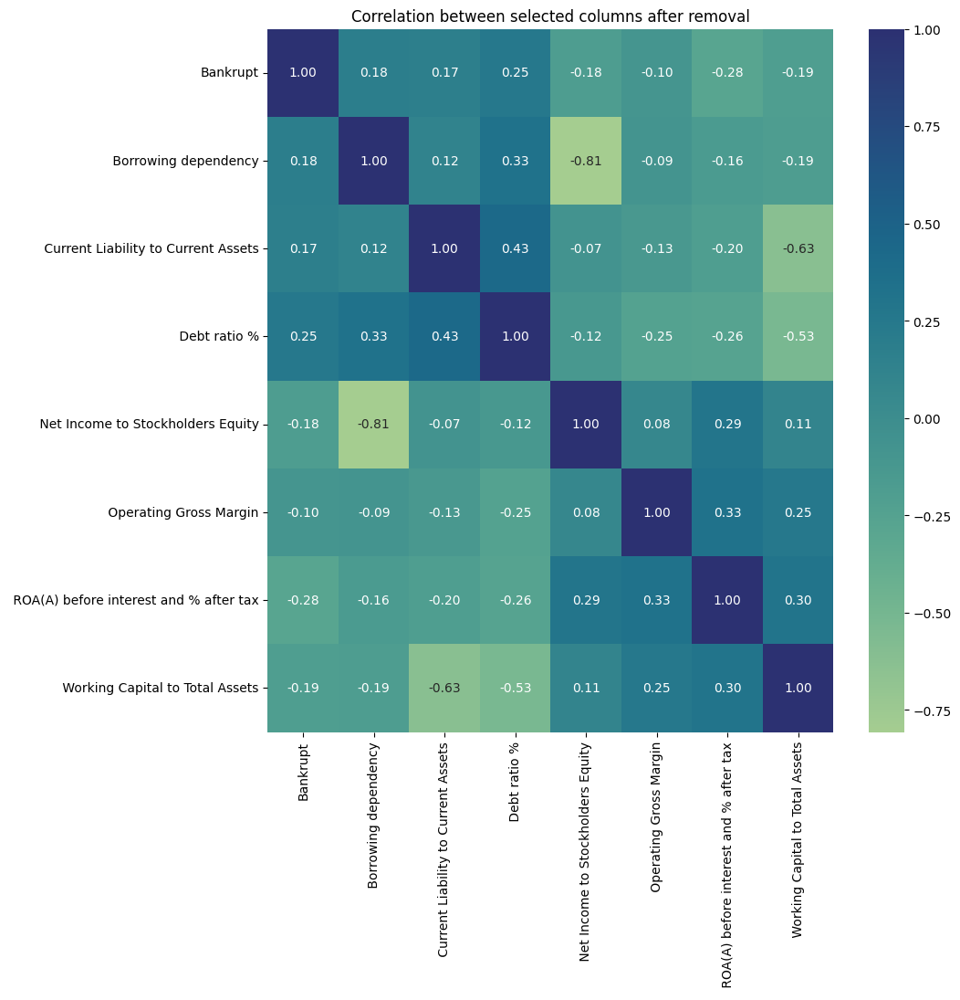

In [16]:
cols_to_remove = [
    ' Net Value Per Share (A)',
    ' Net profit before tax/Paid-in capital',
    ' Net Income to Stockholder\'s Equity',
    ' Persistent EPS in the Last Four Seasons',
    ' Per Share Net profit before tax (Yuan ¥)'
]

# Removing highly correlated columns
selected_columns_1 =[x for x in selected_columns if x not in cols_to_remove]
bankruptcy_df = bankruptcy_df[selected_columns_1]

plt.figure(figsize=(10, 10))
sns.heatmap(bankruptcy_df[selected_columns_1].corr(),cmap="crest",annot=True, fmt=".2f")
plt.title("Correlation between selected columns after removal")
plt.show()

In [17]:
print(bankruptcy_df.columns)

Index(['Bankrupt', ' Borrowing dependency',
       ' Current Liability to Current Assets', ' Debt ratio %',
       ' Net Income to Stockholders Equity', ' Operating Gross Margin',
       ' ROA(A) before interest and % after tax',
       ' Working Capital to Total Assets'],
      dtype='object')


'Pair plot - All selected features'

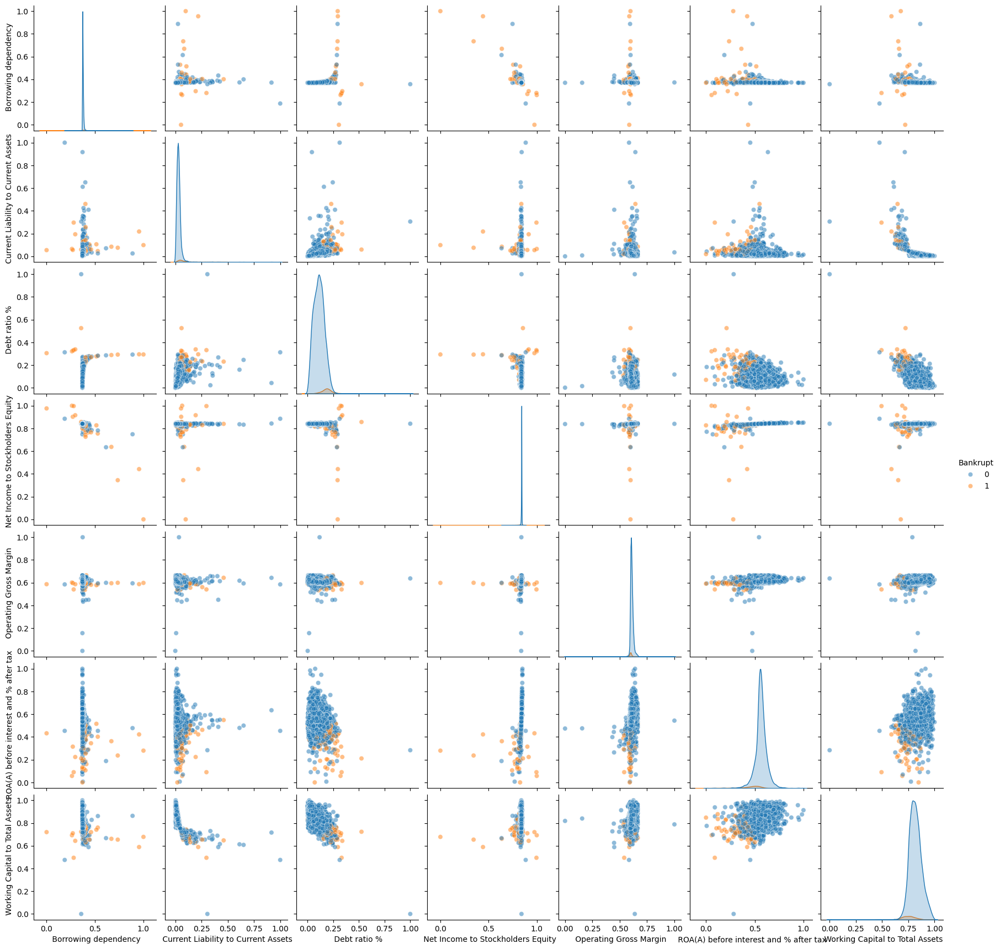

In [18]:
display("Pair plot - All selected features")
sns.pairplot(bankruptcy_df, hue='Bankrupt',plot_kws={'alpha': 0.5})
plt.show()


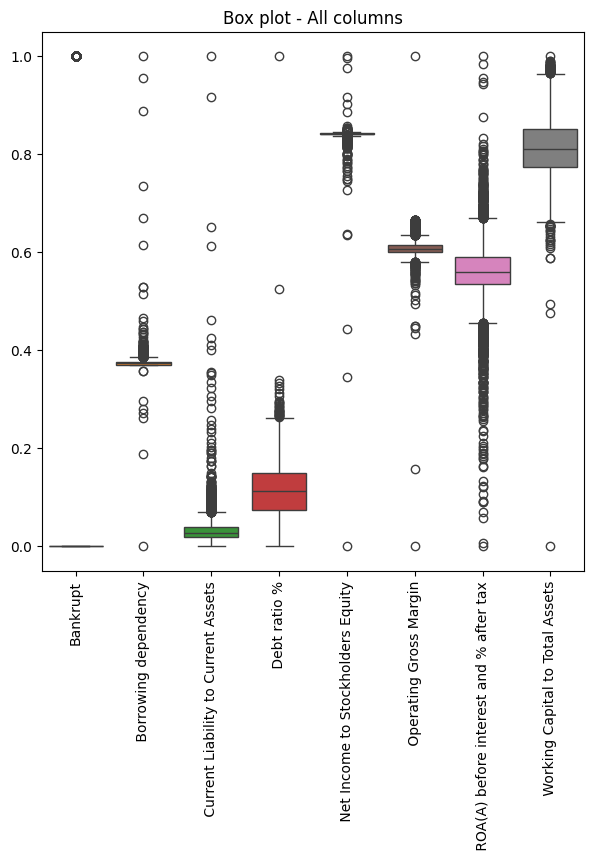

In [19]:
plt.figure(figsize=(7, 7))
sns.boxplot(data=bankruptcy_df)
plt.xticks(rotation=90)
plt.title("Box plot - All columns")
plt.show()

In [20]:
#Fixing Imbalance dataset

In [21]:
class_dist = pd.DataFrame(bankruptcy_df['Bankrupt'].value_counts())
class_dist['Bankrupt %'] = round((class_dist['Bankrupt']/sum(class_dist['Bankrupt']))*100,2)
class_dist['Bankrupt %'] = class_dist['Bankrupt %'].apply(str)
class_dist['Bankrupt %'] = class_dist['Bankrupt %'] +"%"

print("Bankruptcy distribution :\n")
print(class_dist)

Bankruptcy distribution :

   Bankrupt Bankrupt %
0      6599     96.77%
1       220      3.23%


In [22]:
# Lets split features and target variable into X and y
X = bankruptcy_df.drop(['Bankrupt'],axis=1)
y = bankruptcy_df['Bankrupt']

In [23]:
# Lets oversample our dataset using SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

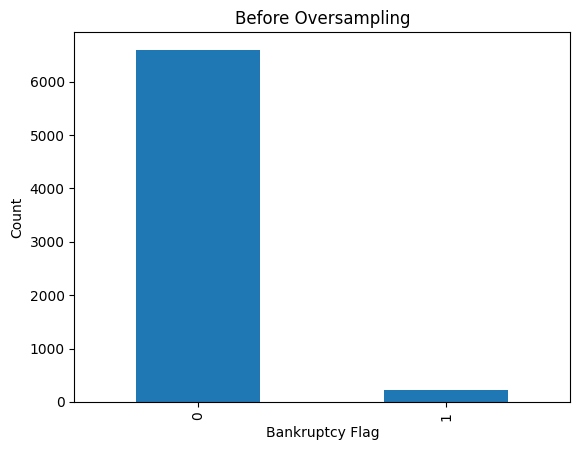

In [24]:
bankruptcy_df['Bankrupt'].value_counts().plot(kind="bar")
plt.xlabel("Bankruptcy Flag")
plt.ylabel("Count")
plt.title("Before Oversampling")
plt.show()

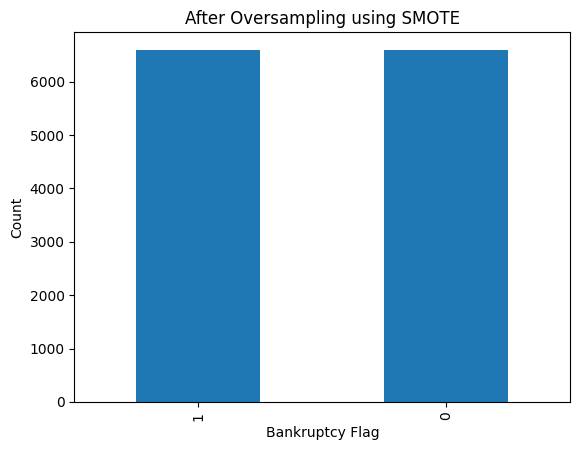

In [25]:
y_res.value_counts().plot(kind="bar")
plt.xlabel("Bankruptcy Flag")
plt.ylabel("Count")
plt.title("After Oversampling using SMOTE")
plt.show()

'Pair plot - All selected features after resampling'

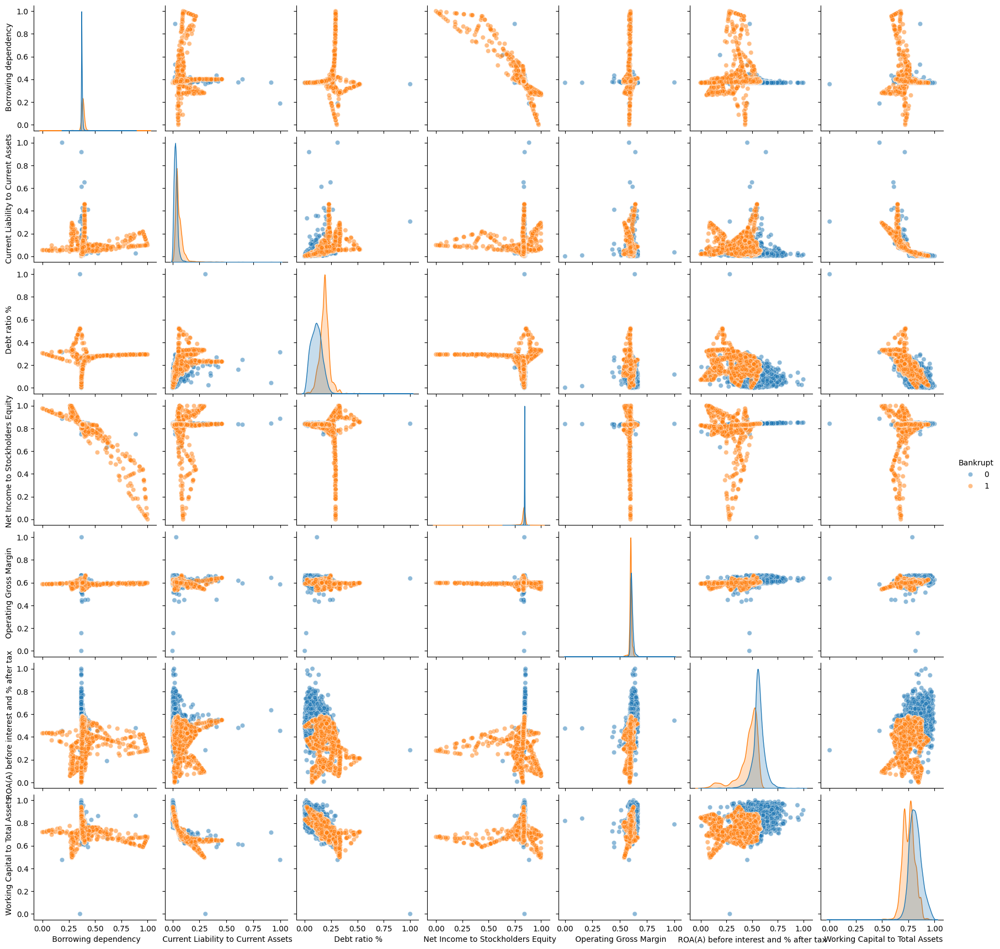

In [26]:
bankruptcy_resampled_df = X_res.copy()
bankruptcy_resampled_df['Bankrupt'] = y_res.copy()

# Scatter plot - Relationship between features with Bankruptcy hue after resampling
display("Pair plot - All selected features after resampling")
sns.pairplot(bankruptcy_resampled_df, hue='Bankrupt',plot_kws={'alpha': 0.5})
plt.show()

In [27]:
X_train, X_test, y_train, y_test = train_test_split( X_res, y_res, test_size=0.30, random_state=42,stratify=y_res)

In [28]:
log_reg_model = LogisticRegression(random_state=42)
svm_model = SVC(random_state=42,probability=True)
decision_tree_model = DecisionTreeClassifier(random_state=42)

In [29]:
log_reg_model.fit(X_train,y_train)

LogisticRegression(random_state=42)

In [30]:
svm_model.fit(X_train,y_train)

SVC(probability=True, random_state=42)

In [31]:
decision_tree_model.fit(X_train,y_train)

DecisionTreeClassifier(random_state=42)

In [32]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate_model_performance(model, X_test, y_test, average='binary'):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average=average)
    recall = recall_score(y_test, y_pred, average=average)
    f1 = f1_score(y_test, y_pred, average=average)
    return accuracy, precision, recall, f1

In [33]:
log_reg_accuracy, log_reg_precision, log_reg_recall, log_reg_f1 = evaluate_model_performance(log_reg_model, X_test, y_test)
svm_accuracy, svm_precision, svm_recall, svm_f1 = evaluate_model_performance(svm_model, X_test, y_test)
decision_tree_accuracy, decision_tree_precision, decision_tree_recall, decision_tree_f1 = evaluate_model_performance(decision_tree_model, X_test, y_test)

In [34]:
print("Logistic Regression Performance:")
print(f"Accuracy: {log_reg_accuracy:.4f}")
print(f"Precision: {log_reg_precision:.4f}")
print(f"Recall: {log_reg_recall:.4f}")
print(f"F1-score: {log_reg_f1:.4f}")
print()

Logistic Regression Performance:
Accuracy: 0.8588
Precision: 0.8579
Recall: 0.8601
F1-score: 0.8590



In [35]:
print("SVM Performance:")
print(f"Accuracy: {svm_accuracy:.4f}")
print(f"Precision: {svm_precision:.4f}")
print(f"Recall: {svm_recall:.4f}")
print(f"F1-score: {svm_f1:.4f}")
print()

SVM Performance:
Accuracy: 0.8576
Precision: 0.8388
Recall: 0.8854
F1-score: 0.8614



In [36]:
print("Decision Tree Performance:")
print(f"Accuracy: {decision_tree_accuracy:.4f}")
print(f"Precision: {decision_tree_precision:.4f}")
print(f"Recall: {decision_tree_recall:.4f}")
print(f"F1-score: {decision_tree_f1:.4f}")

Decision Tree Performance:
Accuracy: 0.9402
Precision: 0.9312
Recall: 0.9505
F1-score: 0.9408


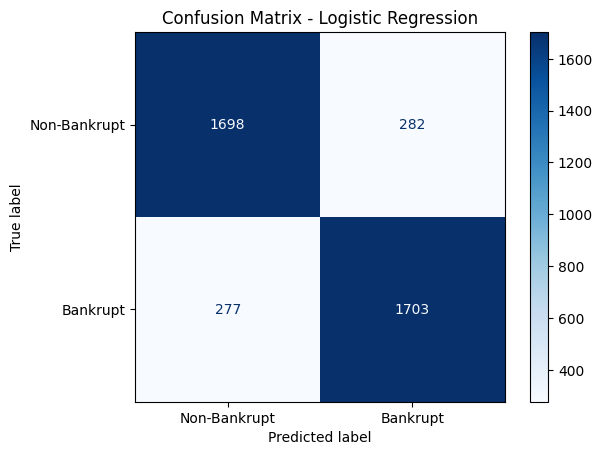

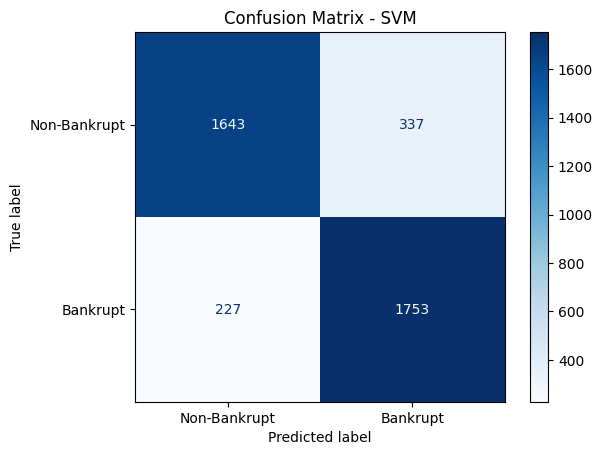

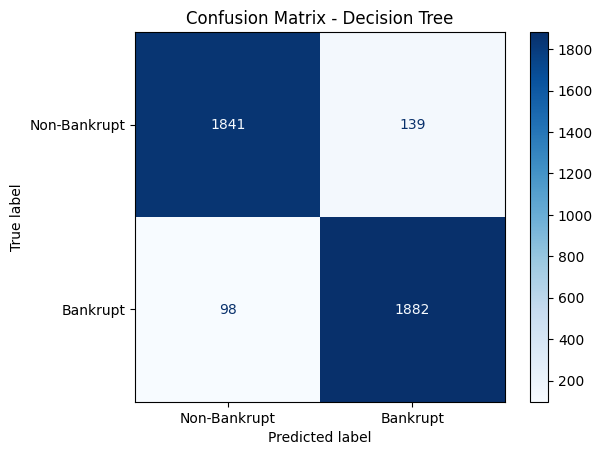

In [43]:
from sklearn.metrics import ConfusionMatrixDisplay

# Confusion matrix for Logistic Regression
log_reg_cm = confusion_matrix(y_test, log_reg_model.predict(X_test))
ConfusionMatrixDisplay(log_reg_cm, display_labels=["Non-Bankrupt", "Bankrupt"]).plot(cmap='Blues')
plt.title('Confusion Matrix - Logistic Regression')
plt.show()

# Confusion matrix for SVM
svm_cm = confusion_matrix(y_test, svm_model.predict(X_test))
ConfusionMatrixDisplay(svm_cm, display_labels=["Non-Bankrupt", "Bankrupt"]).plot(cmap='Blues')
plt.title('Confusion Matrix - SVM')
plt.show()

# Confusion matrix for Decision Tree
decision_tree_cm = confusion_matrix(y_test, decision_tree_model.predict(X_test))
ConfusionMatrixDisplay(decision_tree_cm, display_labels=["Non-Bankrupt", "Bankrupt"]).plot(cmap='Blues')
plt.title('Confusion Matrix - Decision Tree')
plt.show()


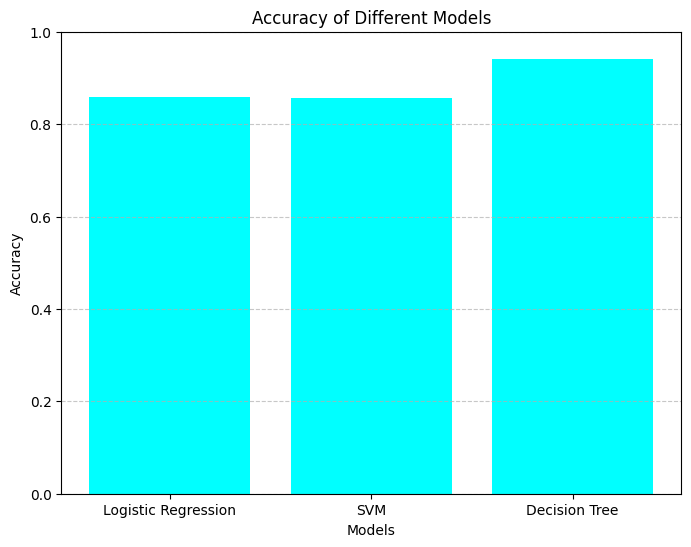

In [38]:
import matplotlib.pyplot as plt

# Accuracy values (example values, replace with your actual values)
accuracies = [log_reg_accuracy, svm_accuracy, decision_tree_accuracy]
models = ['Logistic Regression', 'SVM', 'Decision Tree']

# Plotting the bar graph
plt.figure(figsize=(8, 6))
plt.bar(models, accuracies, color=['aqua'])
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy of Different Models')
plt.ylim(0.0, 1.0)  # Set the y-axis limits to ensure visibility of differences
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


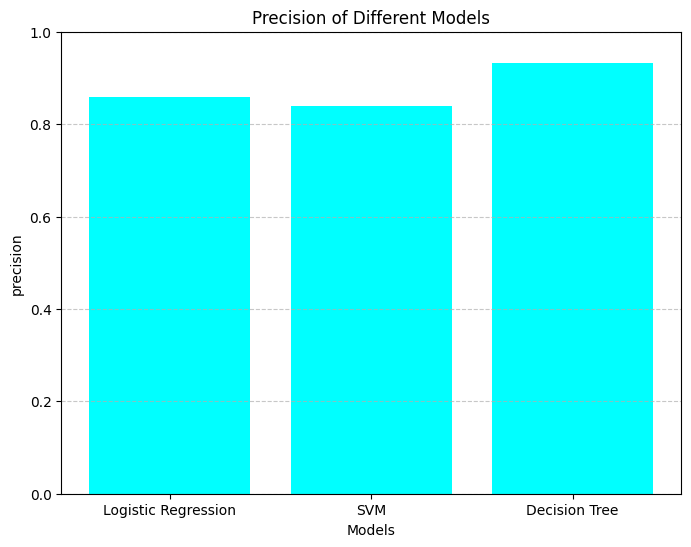

In [39]:
# Accuracy values (example values, replace with your actual values)
precision=[log_reg_precision, svm_precision, decision_tree_precision]
models = ['Logistic Regression', 'SVM', 'Decision Tree']

# Plotting the bar graph
plt.figure(figsize=(8, 6))
plt.bar(models, precision, color=['aqua'])
plt.xlabel('Models')
plt.ylabel('precision')
plt.title('Precision of Different Models')
plt.ylim(0.0, 1.0)  # Set the y-axis limits to ensure visibility of differences
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


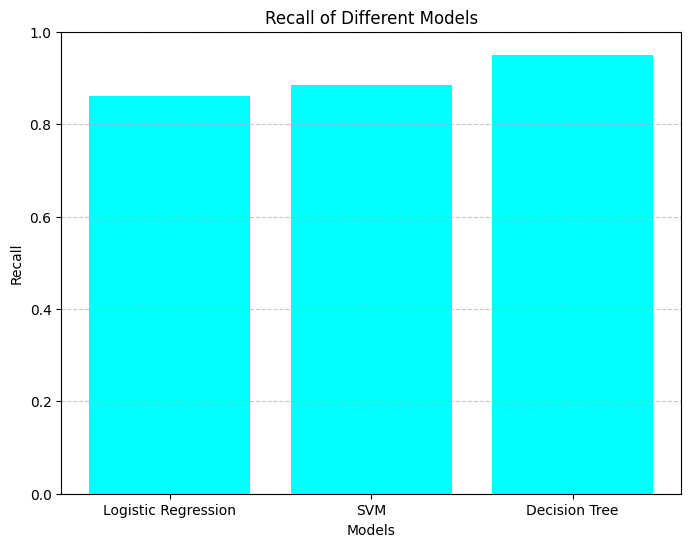

In [40]:
recall=[log_reg_recall, svm_recall, decision_tree_recall]
models = ['Logistic Regression', 'SVM', 'Decision Tree']
plt.figure(figsize=(8, 6))
plt.bar(models, recall, color=['aqua'])
plt.xlabel('Models')
plt.ylabel('Recall')
plt.title('Recall of Different Models')
plt.ylim(0.0, 1.0)  # Set the y-axis limits to ensure visibility of differences
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


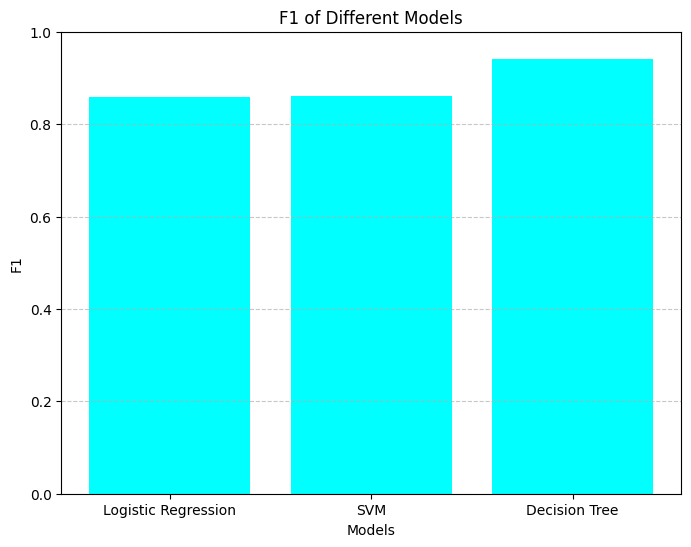

In [41]:
f1=[log_reg_f1, svm_f1, decision_tree_f1]
models = ['Logistic Regression', 'SVM', 'Decision Tree']
plt.figure(figsize=(8, 6))
plt.bar(models, f1, color=['aqua'])
plt.xlabel('Models')
plt.ylabel('F1')
plt.title('F1 of Different Models')
plt.ylim(0.0, 1.0)  # Set the y-axis limits to ensure visibility of differences
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()